# Task

With AI-modelling and Data Science there is plenty of opportunity to improve processes or suggest improved ways of doing things. When doing so it is often very smart and efficient (time is a scarce resource) to create a POC (Proof of Concept) which basically is a small demo checking wether it is worthwile going further with something. It is also something concrete which facilitates discussions, do not underestimate the power of that. 

In this example, you are working in a company that sells houses and they have a "manual" process of setting prices by humans. You as a Data Scientist can make this process better by using Machine Learning. Your task is to create a POC that you will present to your team colleagues and use as a source of discussion of wether or not you should continue with more detailed modelling. 

Two quotes to facilitate your reflection on the value of creating a PoC: 

"*Premature optimization is the root of all evil*". 

"*Fail fast*".


**More specifially, do the following:**
1. A short EDA (Exploratory Data Analysis) of the housing data set.
2. Drop the column `ocean_proximity`, then you only have numeric columns which will simplify your analysis. Remember, this is a POC! 
3. You have missing values in your data (not sure you do but you can assume so). Handle this with `SimpleImputer(strategy="median")`. (Check the fantastic Scikit-learn documentation for details.) Notice, the `SimpleImputer` should only be used for transformation on the validation and test data, not fitting.
4. Split your data into `X` and `y`, and then into train, validation and test sets. 
5. Create one `LinearRegression` model and one `Lasso` model. For the `Lasso` model, use `GridSearchCV` to optimize $\alpha$ values. Choose yourself which $\alpha$ values to evaluate.
Use RMSE as a metric to decide which model to choose. 

6. Which model is best on the validation data? 

7. Evaluate your chosen model on the test set using the root mean squared error (RMSE) as the metric. 
What are your conclusions? Note: to be 100% sure, you should re-fit your chosen model on the combination of train+val data. 

8. Do a short presentation (~ 2-5 min) on your POC that you present to your colleagues (no need to prepare anything particular, just talk from the code). Think of:
- What do you want to highlight/present?
- What is your conclusion?
- What could be the next step? Is the POC convincing enough or is it not worthwile continuing? Do we need to dig deeper into this before taking some decisions?

------------
Bonus question for those who have time and are ambitious: Redo everything above (copy your code) but in step 2, include the column `ocean_proximity` which is a categorical column. 

# Code

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb  # Importera XGBoost

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate

from sklearn.metrics import mean_squared_error, root_mean_squared_error, r2_score

from tabulate import tabulate


In [4]:
# Below, set your own path where you have stored the data file if it is not in the /data folder. 
housing = pd.read_csv(r'data/housing.csv')


## EDA

In [5]:
# print(housing.describe)

# Omvandla hela DataFrame:n till en lista av listor (eller en numpy-array)
data = housing.values.tolist()  # eller data = housing.values

# Skapa tabellen med tabulate
table = tabulate(data, headers=housing.columns, tablefmt='fancy_grid')
print(table)




╒═════════════╤════════════╤══════════════════════╤═══════════════╤══════════════════╤══════════════╤══════════════╤═════════════════╤══════════════════════╤═══════════════════╕
│   longitude │   latitude │   housing_median_age │   total_rooms │   total_bedrooms │   population │   households │   median_income │   median_house_value │ ocean_proximity   │
╞═════════════╪════════════╪══════════════════════╪═══════════════╪══════════════════╪══════════════╪══════════════╪═════════════════╪══════════════════════╪═══════════════════╡
│     -122.23 │      37.88 │                   41 │           880 │              129 │          322 │          126 │          8.3252 │               452600 │ NEAR BAY          │
├─────────────┼────────────┼──────────────────────┼───────────────┼──────────────────┼──────────────┼──────────────┼─────────────────┼──────────────────────┼───────────────────┤
│     -122.22 │      37.86 │                   21 │          7099 │             1106 │         2401 │         

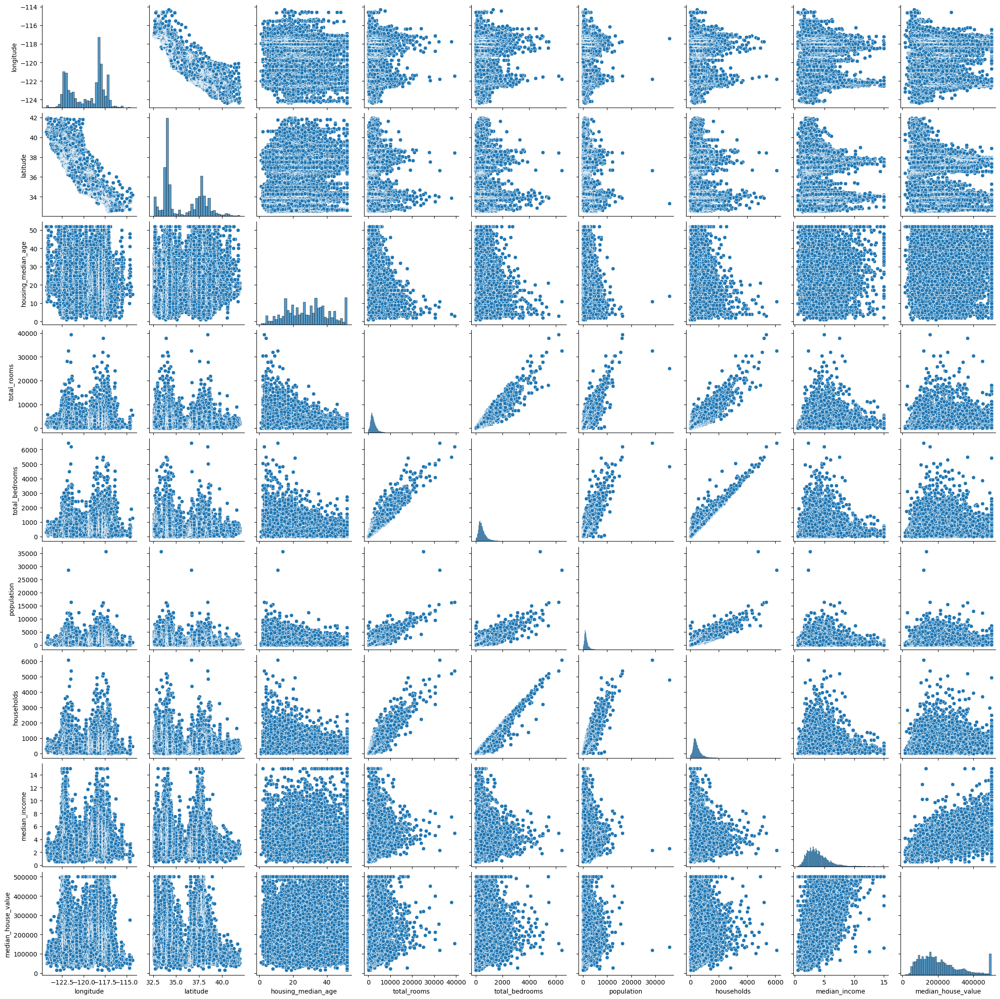

In [6]:
#Pair plot
# Välj ut alla numeriska kolumner
numerical_columns = housing.select_dtypes(include=np.number).columns.tolist()

# Skapa pair plotten
sns.pairplot(housing[numerical_columns])

# Visa plotten
plt.show()

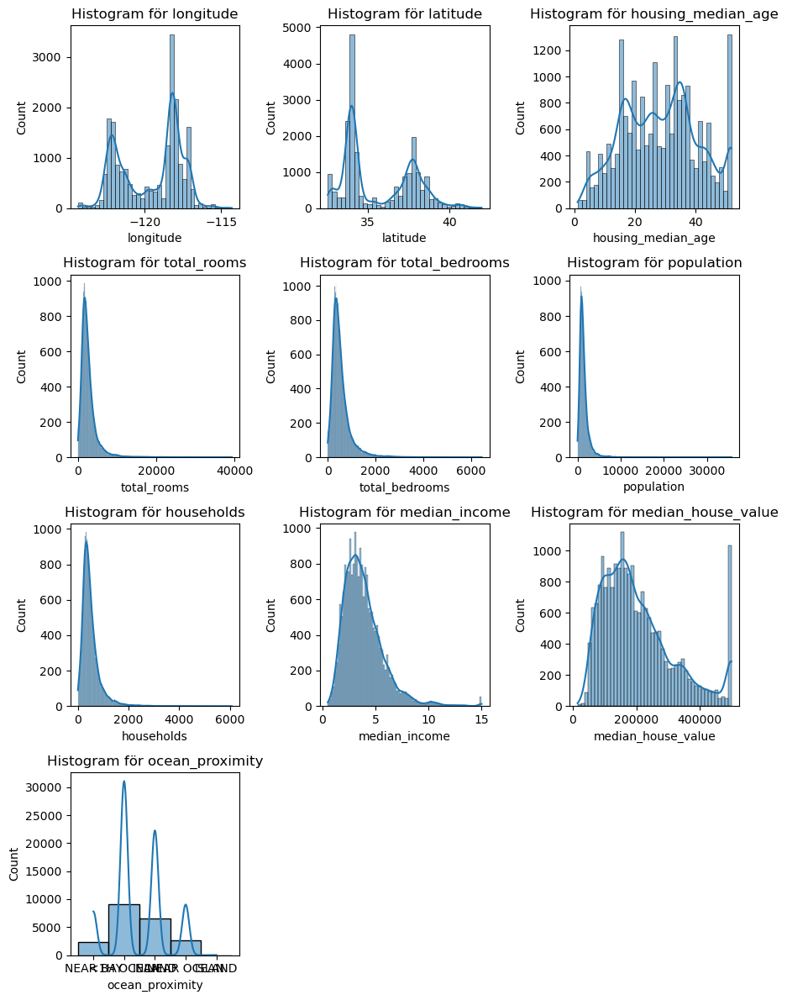

In [7]:
# Antal kolumner och rader i rutnätet
n_cols = 3
n_rows = (len(housing.columns) + n_cols - 1) // n_cols

# Skapa subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(9, 3 * n_rows))  # Justera figsize efter behov

# Loopa igenom kolumnerna och skapa histogramplottar
for i, column in enumerate(housing.columns):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]  # Välj rätt subplot

    sns.histplot(housing[column], kde=True, ax=ax)
    ax.set_title(f'Histogram för {column}')

# Ta bort tomma subplots (om det finns några)
if len(housing.columns) < n_rows * n_cols:
    for i in range(len(housing.columns), n_rows * n_cols):
        fig.delaxes(axes.flatten()[i])

# Visa plotten
plt.tight_layout()  # Förhindra överlappning av titlar och axelnamn
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

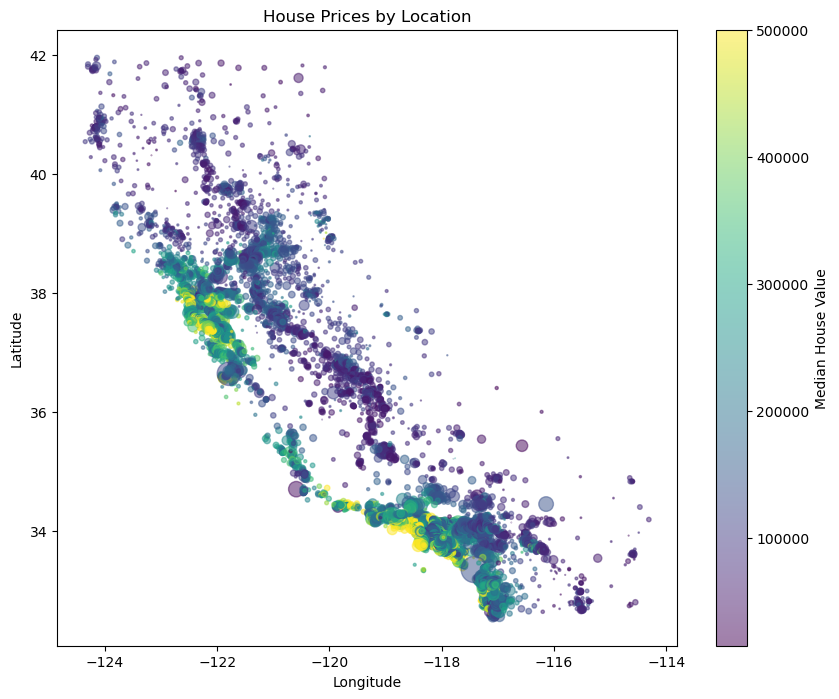

In [8]:
# Skapa scatterplot med färgkodning
plt.figure(figsize=(10, 8))
plt.scatter(housing['longitude'], housing['latitude'], c=housing['median_house_value'], cmap='viridis', s=housing['population']/100, alpha=0.5)
plt.colorbar(label='Median House Value')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('House Prices by Location')
plt.show

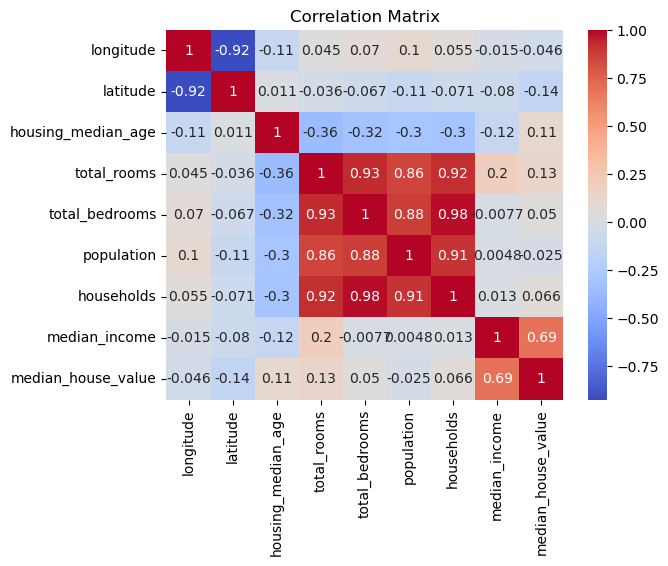

In [9]:
# Skapa housing_filtered genom att ta bort "ocean_proximity" från housing
housing_filtered = housing.drop(columns=["ocean_proximity"])

corr_matrix = housing_filtered.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

## Preparing data

In [10]:
# Dela upp i X och y
X = housing_filtered.drop('median_house_value', axis=1)
y = housing_filtered['median_house_value']

# Dela upp i tränings-, validerings- och testset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)  # 0.25 av 0.8 = 0.2

# Hantera saknade värden med SimpleImputer och gör det sedan separat för varje set
imputer = SimpleImputer(strategy='median')

# Träningsdata (imputerad)
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train.columns)

# Valideringsdata (imputerad)
X_val = pd.DataFrame(imputer.transform(X_val), columns=X_val.columns)

# Testdata (imputerad)
X_test = pd.DataFrame(imputer.transform(X_test), columns=X_test.columns)


## Models

In [12]:
# Create one `LinearRegression` model and one `Lasso` model. For the `Lasso` model, use `GridSearchCV` to optimize $\alpha$ values. Choose yourself which $\alpha$ values to evaluate.
# Use RMSE as a metric to decide which model to choose. 


# Skalar min data.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)  # Använd transform, inte fit_transform, på valideringsdata
X_test_scaled = scaler.transform(X_test) # Använd transform, inte fit_transform, på testdata




# Linjärregression
# Instansiera modellen
lin_reg = LinearRegression()

# Initiera modellen
# lin_reg = LinearRegression(fit_intercept=True)

# Träna modellen
lin_reg = lin_reg.fit(X_train, y_train)

# print(lin_reg.coef_)
# print(lin_reg.intercept_)

# Prediktion av träningsdatan (valideringsdata och testdata)
y_pred_val = lin_reg.predict(X_val)
y_pred_test = lin_reg.predict(X_test)

# Korsvalidering, behövdes ej i uppgiften men vill testa om det blir någon skillnad
scores_val_lin_reg = cross_validate(lin_reg, X_val, y_val, cv=5, scoring='neg_mean_squared_error')
rmse_val_lin_reg = np.sqrt(-scores_val_lin_reg['test_score'])

# Beräkna och utvärdera modellens prestanda på valideringsdata
mse_val_lin_reg = mean_squared_error(y_val, y_pred_val)
rmse_val_lin_reg = root_mean_squared_error(y_val, y_pred_val)
r2_val_lin_reg = r2_score(y_val, y_pred_val)

print("Valideringsdata Regressionsmodellen:")
print(f"MSE: {mse_val_lin_reg:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_val_lin_reg:,.0f}".replace(",", " "))
print(f"R²: {r2_val_lin_reg:.2f}")

# Beräkna och utvärdera modellens prestanda på testdata
mse_test_lin_reg = mean_squared_error(y_test, y_pred_test)
rmse_test_lin_reg = root_mean_squared_error(y_test, y_pred_test)
r2_test_lin_reg = r2_score(y_test, y_pred_test)

print("\nTestdata Regressionsmodellen:")
print(f"MSE: {mse_test_lin_reg:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_test_lin_reg:,.0f}".replace(",", " "))
print(f"R²: {r2_test_lin_reg:.5f}")


# Lasso
# Instansierar
lasso = Lasso()

# Väljer hyperparametrar
# hyper_param_lasso = {'alpha':(0.01, 1, 2,30, 46)}
hyper_param_lasso = {'alpha': np.logspace(-5, 5, 20)} # Testar värden mellan 10^-5 och 10^5

# Använd GridSearchCV för att söka igenom hyperparameter-kombinationer och hitta den bästa Lasso-modellen.
lasso = GridSearchCV(lasso, hyper_param_lasso, cv = 5, scoring='neg_mean_squared_error')

# Träna modellen
lasso.fit(X_train, y_train)

# Skriv ut de bästa hyperparametrarna
print("\nBästa hyperparametrar till Lassomodellen:", lasso.best_params_)

# Använd den bästa modellen för att göra prediktioner
y_pred_val = lasso.best_estimator_.predict(X_val)

# Utvärderar den tränade Lasso-modellen (med GridSearchCV:s bästa parametrar) på valideringsdatan
# genom korsvalidering och beräknar RMSE för varje iteration samt det genomsnittliga RMSE-värdet.
scores_val = cross_validate(lasso.best_estimator_, X_val, y_val, cv=5, scoring='neg_mean_squared_error')
rmse_val_lasso = np.sqrt(-scores_val['test_score'])

print('\nValideringsdata RMSE:')
for rmse in rmse_val_lasso:
    print(f"  {rmse:,.0f}".replace(",", " "))

print('\nGenomsnittlig valideringsdata RMSE för Lassomodellen:', f"{np.mean(rmse_val_lasso):,.0f}".replace(",", " "))

# Gör prediktioner på testdatan 
y_pred_test = lasso.best_estimator_.predict(X_test)

# Beräkna och utvärdera modellens prestanda på valideringsdata
mse_val_lasso = mean_squared_error(y_val, y_pred_val)
rmse_val_lasso = root_mean_squared_error(y_val, y_pred_val)
r2_val_lasso = r2_score(y_val, y_pred_val)

# Beräkna och utvärdera modellens prestanda på testdata
mse_test_lasso = mean_squared_error(y_test, y_pred_test)
rmse_test_lasso = root_mean_squared_error(y_test, y_pred_test)
r2_test_lasso = r2_score(y_test, y_pred_test)

# Skriver ut utvärderingsresultaten för validerings- och testdata.
print("\nValideringsdata Lassomodellen:")
print(f"MSE: {mse_val_lasso:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_val_lasso:,.0f}".replace(",", " "))
print(f"R²: {r2_val_lasso:.2f}")

print("\nTestdata Lassomodellen:")
print(f"MSE: {mse_test_lasso:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_test_lasso:,.0f}".replace(",", " "))
print(f"R²: {r2_test_lasso:.5f}")





# Random Forest Regression
# Instansiera modellen
rf_reg = RandomForestRegressor(random_state=42)

# Väljer hyperparametrar
hyper_param_rf = {
    'n_estimators': [10, 20],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Använd GridSearchCV för att söka igenom hyperparameter-kombinationer och hitta den bästa modellen.
rf_grid = GridSearchCV(rf_reg, hyper_param_rf, cv=5, scoring='neg_mean_squared_error')

# Träna modellen
rf_grid.fit(X_train_scaled, y_train)

# Skriv ut de bästa hyperparametrarna
print("\nBästa hyperparametrar till Random Forest-modellen:", rf_grid.best_params_)

# Använd den bästa modellen för att göra prediktioner
y_pred_val = rf_grid.best_estimator_.predict(X_val_scaled)
y_pred_test = rf_grid.best_estimator_.predict(X_test_scaled)

# Utvärdera modellen på valideringsdata
scores_val_rf = cross_validate(rf_grid.best_estimator_, X_val_scaled, y_val, cv=5, scoring='neg_mean_squared_error')
rmse_val_rf = np.sqrt(-scores_val_rf['test_score'])

print('\nValideringsdata RMSE (Random Forest):')
for rmse in rmse_val_rf:
    print(f"    {rmse:,.0f}".replace(",", " "))

print('\nGenomsnittlig valideringsdata RMSE för Random Forest-modellen:', f"{np.mean(rmse_val_rf):,.0f}".replace(",", " "))

mse_val_rf = mean_squared_error(y_val, y_pred_val)
rmse_val_rf = root_mean_squared_error(y_val, y_pred_val)
r2_val_rf = r2_score(y_val, y_pred_val)

# Utvärdera modellen på testdata
mse_test_rf = mean_squared_error(y_test, y_pred_test)
rmse_test_rf = root_mean_squared_error(y_test, y_pred_test)
r2_test_rf = r2_score(y_test, y_pred_test)

# Skriver ut utvärderingsresultaten
print("\nValideringsdata Random Forest-modellen:")
print(f"MSE: {mse_val_rf:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_val_rf:,.0f}".replace(",", " "))
print(f"R²: {r2_val_rf:.2f}")

print("\nTestdata Random Forest-modellen:")
print(f"MSE: {mse_test_rf:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_test_rf:,.0f}".replace(",", " "))
print(f"R²: {r2_test_rf:.5f}")

Valideringsdata Regressionsmodellen:
MSE: 4 847 455 878
RMSE: 69 624
R²: 0.65

Testdata Regressionsmodellen:
MSE: 5 069 837 217
RMSE: 71 203
R²: 0.61311

Bästa hyperparametrar till Lassomodellen: {'alpha': 20.6913808111479}

Valideringsdata RMSE:
  72 863
  69 188
  71 322
  71 039
  64 643

Genomsnittlig valideringsdata RMSE för Lassomodellen: 69 811

Valideringsdata Lassomodellen:
MSE: 4 847 343 786
RMSE: 69 623
R²: 0.65

Testdata Lassomodellen:
MSE: 5 069 576 129
RMSE: 71 201
R²: 0.61313

Bästa hyperparametrar till Random Forest-modellen: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 20}

Valideringsdata RMSE (Random Forest):
    59 170
    58 174
    59 801
    57 218
    53 335

Genomsnittlig valideringsdata RMSE för Random Forest-modellen: 57 540

Valideringsdata Random Forest-modellen:
MSE: 2 676 207 958
RMSE: 51 732
R²: 0.81

Testdata Random Forest-modellen:
MSE: 2 718 253 970
RMSE: 52 137
R²: 0.79256


In [13]:
# XGBoost Regression
# Instansiera modellen
xgb_reg = xgb.XGBRegressor(random_state=42)

# Väljer hyperparametrar
hyper_param_xgb = {
    'n_estimators': [10, 20],
    'max_depth': [3, 5, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Använd GridSearchCV för att söka igenom hyperparameter-kombinationer och hitta den bästa modellen.
xgb_grid = GridSearchCV(xgb_reg, hyper_param_xgb, cv=5, scoring='neg_mean_squared_error')

# Träna modellen
xgb_grid.fit(X_train_scaled, y_train)

# Skriv ut de bästa hyperparametrarna
print("\nBästa hyperparametrar till XGBoost-modellen:", xgb_grid.best_params_)

# Använd den bästa modellen för att göra prediktioner
y_pred_val = xgb_grid.best_estimator_.predict(X_val_scaled)
y_pred_test = xgb_grid.best_estimator_.predict(X_test_scaled)

# Utvärdera modellen på valideringsdata
scores_val_xgb = cross_validate(xgb_grid.best_estimator_, X_val_scaled, y_val, cv=5, scoring='neg_mean_squared_error')
rmse_val_xgb = np.sqrt(-scores_val_xgb['test_score'])

print('\nValideringsdata RMSE (XGBoost):')
for rmse in rmse_val_xgb:
    print(f"    {rmse:,.0f}".replace(",", " "))

print('\nGenomsnittlig valideringsdata RMSE för XGBoost-modellen:', f"{np.mean(rmse_val_xgb):,.0f}".replace(",", " "))

mse_val_xgb = mean_squared_error(y_val, y_pred_val)
rmse_val_xgb = root_mean_squared_error(y_val, y_pred_val)
r2_val_xgb = r2_score(y_val, y_pred_val)

# Utvärdera modellen på testdata
mse_test_xgb = mean_squared_error(y_test, y_pred_test)
rmse_test_xgb = root_mean_squared_error(y_test, y_pred_test)
r2_test_xgb = r2_score(y_test, y_pred_test)

# Skriver ut utvärderingsresultaten
print("\nValideringsdata XGBoost-modellen:")
print(f"MSE: {mse_val_xgb:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_val_xgb:,.0f}".replace(",", " "))
print(f"R²: {r2_val_xgb:.2f}")

print("\nTestdata XGBoost-modellen:")
print(f"MSE: {mse_test_xgb:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_test_xgb:,.0f}".replace(",", " "))
print(f"R²: {r2_test_xgb:.5f}")


Bästa hyperparametrar till XGBoost-modellen: {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 20, 'subsample': 1.0}

Valideringsdata RMSE (XGBoost):
    57 927
    58 187
    57 493
    55 053
    52 305

Genomsnittlig valideringsdata RMSE för XGBoost-modellen: 56 193

Valideringsdata XGBoost-modellen:
MSE: 2 427 212 382
RMSE: 49 267
R²: 0.82

Testdata XGBoost-modellen:
MSE: 2 429 026 144
RMSE: 49 285
R²: 0.81464


## Evaluation

In [15]:
print("RMSE före refit av modellerna")
print(f"RMSE Linear Regression: {rmse_test_lin_reg:,.0f}".replace(",", " "))
print(f"RMSE Lasso: {rmse_test_lasso:,.0f}".replace(",", " "))
print(f"RMSE Random Forest: {rmse_test_rf:,.0f}".replace(",", " "))

# Slår samman träningsdata och valideringsdata för att träna om bästa modellen
X_allTrainingData = pd.concat([X_train, X_val])
y_allTrainingData = pd.concat([y_train, y_val])

# Skala all träningsdata och testdata
scaler = StandardScaler()
X_allTrainingData_scaled = scaler.fit_transform(X_allTrainingData)
X_test_scaled = scaler.transform(X_test)


# Re-fit:ar regressionsmodellen
lin_reg.fit(X_allTrainingData_scaled,y_allTrainingData)
y_pred_test = lin_reg.predict(X_test_scaled)

# Beräkna och utvärdera modellens prestanda på testdata
mse_lin_reg_allTrainingData = mean_squared_error(y_test, y_pred_test)
rmse_lin_reg_allTrainingData = root_mean_squared_error(y_test, y_pred_test)
r2_lin_reg_allTrainingData = r2_score(y_test, y_pred_test)

print("\nTestdata på den Re-fitade Regressionsmodellen:")
print(f"MSE: {mse_lin_reg_allTrainingData:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_lin_reg_allTrainingData:,.0f}".replace(",", " "))
print(f"R²: {r2_lin_reg_allTrainingData:.5f}")


# Re-fit:ar lassomodellen
lasso.fit(X_allTrainingData_scaled, y_allTrainingData)
y_pred_test = lasso.best_estimator_.predict(X_test_scaled)


# Beräkna och utvärdera modellens prestanda på testdata
mse_lasso_allTrainingData = mean_squared_error(y_test, y_pred_test)
rmse_lasso_allTrainingData = root_mean_squared_error(y_test, y_pred_test)
r2_lasso_allTrainingData = r2_score(y_test, y_pred_test)

print("\nTestdata på den Re-fitade Lassomodellen:")
print(f"MSE: {mse_lasso_allTrainingData:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_lasso_allTrainingData:,.0f}".replace(",", " "))
print(f"R²: {r2_lasso_allTrainingData:.5f}")


# Re-fit:ar Random Forest-modellen
rf_reg.fit(X_allTrainingData_scaled, y_allTrainingData)
y_pred_test = rf_reg.predict(X_test_scaled)

# Beräkna och utvärdera modellens prestanda på testdata
mse_rf_allTrainingData = mean_squared_error(y_test, y_pred_test)
rmse_rf_allTrainingData = root_mean_squared_error(y_test, y_pred_test)
r2_rf_allTrainingData = r2_score(y_test, y_pred_test)

print("\nTestdata på den Re-fitade Random Forest-modellen:")
print(f"MSE: {mse_rf_allTrainingData:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_rf_allTrainingData:,.0f}".replace(",", " "))
print(f"R²: {r2_rf_allTrainingData:.5f}")




# XGBoost Regression (Re-fit)
# Instansiera modellen med de bästa hyperparametrarna
xgb_reg = xgb.XGBRegressor(random_state=42, **xgb_grid.best_params_)

# Träna modellen på all träningsdata
xgb_reg.fit(X_allTrainingData_scaled, y_allTrainingData)

# Förutsäg på testdata
y_pred_test = xgb_reg.predict(X_test_scaled)

# Beräkna och utvärdera modellens prestanda på testdata
mse_xgb_allTrainingData = mean_squared_error(y_test, y_pred_test)
rmse_xgb_allTrainingData = root_mean_squared_error(y_test, y_pred_test)
r2_xgb_allTrainingData = r2_score(y_test, y_pred_test)

print("\nTestdata på den Re-fitade XGBoost-modellen:")
print(f"MSE: {mse_xgb_allTrainingData:,.0f}".replace(",", " "))
print(f"RMSE: {rmse_xgb_allTrainingData:,.0f}".replace(",", " "))
print(f"R²: {r2_xgb_allTrainingData:.5f}")

RMSE före refit av modellerna
RMSE Linear Regression: 71 203
RMSE Lasso: 71 201
RMSE Random Forest: 52 137

Testdata på den Re-fitade Regressionsmodellen:
MSE: 5 059 521 897
RMSE: 71 130
R²: 0.61390

Testdata på den Re-fitade Lassomodellen:
MSE: 5 054 087 283
RMSE: 71 092
R²: 0.61431

Testdata på den Re-fitade Random Forest-modellen:
MSE: 2 506 780 447
RMSE: 50 068
R²: 0.80870

Testdata på den Re-fitade XGBoost-modellen:
MSE: 2 366 667 753
RMSE: 48 648
R²: 0.81939


## Conclusions

### Linjära regressionsmodellen och lassomodellen får väldigt liknande resultat och känns inte som att de är så bra. Medan Random Forest modellen ger ett mycket bättre resultat men tar också mycket längre tid att träna.

#### Regressionsmodellen: RMSE: 71 130
#### Lassomodellen: RMSE: 71 130
#### Random Forest-modellen: RMSE: 50 061